In [1]:
import torch
import torch.nn.functional as F
from torch import nn, optim
from torch.utils.data import Dataset
from torchvision import transforms, models
from torchvision.utils import make_grid
import cv2
from PIL import Image

import os
import time
import lrResnet

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (30,30)

os.environ['CUDA_VISIBLE_DEVICES'] = "0,1,2,3"

In [2]:
class MultiscaleDataset(Dataset):
    def __init__(self, root, transform, LR_scale=2, HR_size=[224,224]):               
        self.image_list = []
        self.LR_scale = LR_scale
        
        self.transform = transform
        
        self.LR_transform = transforms.Resize(HR_size[0]//LR_scale)
        self.ToTensor = transforms.ToTensor()
        
        class_dirs = os.listdir(root)
        
        for label, class_dir in enumerate(class_dirs):
            image_dirs = os.listdir(os.path.join(root,class_dir))
            for img_path in image_dirs:
                self.image_list.append([label, os.path.join(root, class_dir, img_path)])
                
    def __len__(self):
        return len(self.image_list)
    
    def __getitem__(self, index):
        label = self.image_list[index][0]
        img = Image.open(self.image_list[index][1])
        
        img_modified = self.transform(img)
        
        HR = self.ToTensor(img_modified)
        LR = self.ToTensor(self.LR_transform(img_modified))
        
        # Exception handling for the grayscale images.
        if(HR.shape[0] == 1):
            HR = HR.repeat(3, 1, 1)
        if(LR.shape[0] == 1):
            LR = LR.repeat(3, 1, 1)
        #----------------------------------------------
        
        return LR, HR, label
    
def get_train_loader(root='/data/ILSVRC_Birds/train/', LR_scale=2, HR_size=[224,224], batch_size=128, num_workers=8):
    transform = transforms.Compose([
            transforms.RandomResizedCrop(224),
            transforms.RandomHorizontalFlip(),
    ])
    
    train_dataset = MultiscaleDataset(root, transform=transform, LR_scale=LR_scale, HR_size=HR_size)
    train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
    
    return train_dataloader

def get_test_loader(root='/data/ILSVRC_Birds/val/', LR_scale=2, HR_size=[224,224], batch_size=128, num_workers=8):
    transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
    ])
    
    test_dataset = MultiscaleDataset(root, transform=transform, LR_scale=LR_scale, HR_size=HR_size)
    test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
    
    return test_dataloader

LR_scale = 4
train_loader = get_train_loader(LR_scale=LR_scale, batch_size=64, num_workers=8)
test_loader = get_test_loader(LR_scale=LR_scale, batch_size=64, num_workers=8)

torch.Size([64, 3, 224, 224]) torch.Size([64, 3, 56, 56]) torch.Size([64])


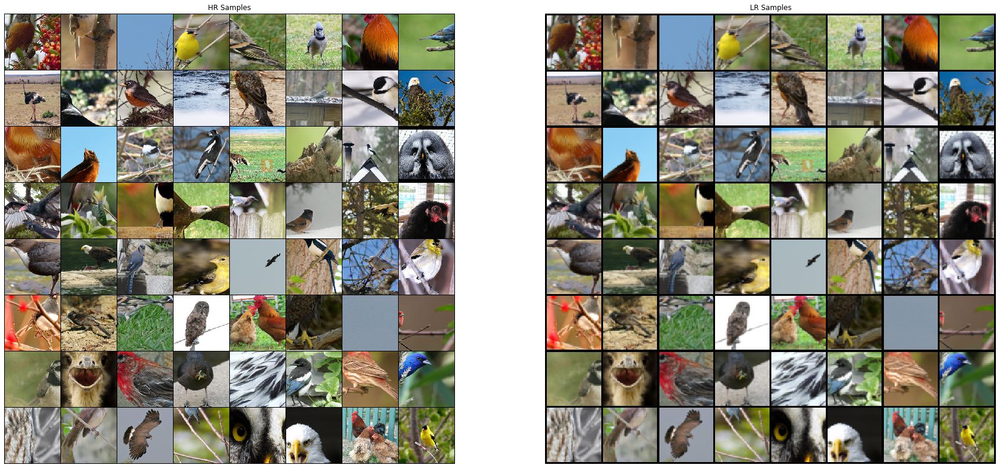

torch.Size([64, 3, 224, 224]) torch.Size([64, 3, 56, 56]) torch.Size([64])


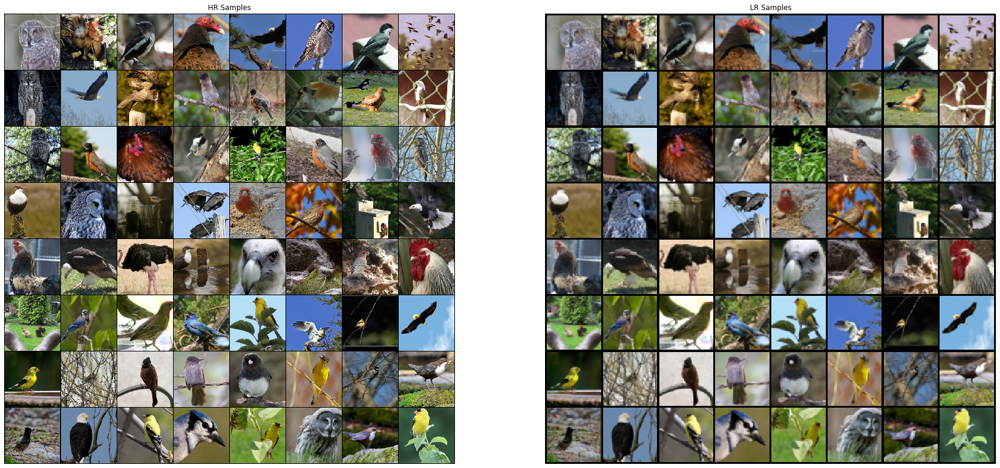

In [3]:
for data in train_loader:
    LR, HR, label = data[0], data[1], data[2]
    print(HR.shape, LR.shape, label.shape)
    
    fig, ax = plt.subplots(1,2)
    
    LR_samples = make_grid(LR, nrow=8).permute(1,2,0)
    HR_samples = make_grid(HR, nrow=8).permute(1,2,0)
    ax[0].imshow(HR_samples)
    ax[0].axis('off')
    ax[0].set_title('HR Samples')
    ax[1].imshow(LR_samples)
    ax[1].axis('off')
    ax[1].set_title('LR Samples')
    plt.show()
    break
    
for data in test_loader:
    LR, HR, label = data[0], data[1], data[2]
    print(HR.shape, LR.shape, label.shape)
    
    fig, ax = plt.subplots(1,2)
    
    LR_samples = make_grid(LR, nrow=8).permute(1,2,0)
    HR_samples = make_grid(HR, nrow=8).permute(1,2,0)
    ax[0].imshow(HR_samples)
    ax[0].axis('off')
    ax[0].set_title('HR Samples')
    ax[1].imshow(LR_samples)
    ax[1].axis('off')
    ax[1].set_title('LR Samples')
    plt.show()
    break

In [5]:
def get_model(model, down_scale=2, pretrained=False, num_classes = 18):
    if model == 'resnet50':
        if down_scale == 1:
            net = models.resnet50(pretrained=pretrained)
        else:
            net = lrResnet.resnet50_LR(scale=down_scale, pretrained=pretrained)
        net.fc = nn.Linear(in_features=2048, out_features=num_classes)
    elif model == 'resnet34':
        if down_scale == 1:
            net = models.resnet34(pretrained=pretrained)
        else:
            net = lrResnet.resnet34_LR(scale=down_scale, pretrained=pretrained)
        net.fc = nn.Linear(in_features=512, out_features=num_classes)
        
    elif model == 'resnet18':
        if down_scale == 1:
            net = models.resnet18(pretrained=pretrained)
        else:
            net = lrResnet.resnet18_LR(scale=down_scale, pretrained=pretrained)
        net.fc = nn.Linear(in_features=512, out_features=num_classes)
    return net

In [19]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

data_name = "birds"

# Not actually T-S network.
teacher_name = 'resnet18'
student_name = 'resnet18'
print(f"Teacher: {teacher_name}, Student: {student_name}")

net_t = get_model(teacher_name, 1, pretrained=True, num_classes=18)
net_t = net_t.to(device)

net_s = get_model(student_name, 1, pretrained=False, num_classes=18)
net_s = net_s.to(device)

Teacher: resnet18, Student: resnet18


NameError: name 'HookWrapper' is not defined

In [22]:
class Ensemble(nn.Module):

class FusedNetwork(nn.Module):
    def __init__(self, f_map_t, f_map_s, num_classes=10):
        super(Ensemble, self).__init__()

        in_channels = f_map_t.shape[1] + f_map_s.shape[1] # Channel width after concatenation.

        self.d_conv = nn.Conv2d(in_channels, N, kernel_size=3, groups=in_channels)
        self.p_conv = nn.Conv2d(N, out_channels, kernel_size=1)

        self.activation = nn.ReLU()

        self.avgpool = nn.AdaptiveAvgPool2d([7,7])

        self.fused_fc = nn.Sequential({
            nn.Linear(M, 1024),
            nn.Linear(1024,num_classes)
        })

    def forward(self, f_map_t, f_map_s):
        
        f_cat = torch.cat(f_map_t, f_map_s, dim=1) # Channel dimension concatenation

        f_cat = self.activation(self.d_conv(f_cat))
        f_cat = self.activation(self.p_conv(f_cat))
        
        f_cat = self.avgpool(f_cat)

        f_cat = f_cat.flatten(-1)

        logit = self.fused_fc(f_cat)

        return logit



In [7]:
# For multiple GPU support
net_t = nn.DataParallel(net_t)
net_s = nn.DataParallel(net_s)

# New loss function between LR and HR representation
1. Fitting the feature map size 
    - Teacher(1x) : 224 -> (MaxPool) -> 112 -> 56 -> 28 -> 14 -> 7 GAP
    - Student (Smaller ResNets)
        - Ch  : 3   -> 64  -> 64  -> 128 -> 256 -> 512 
        - 2x  : 112 -> 112 -> 56  -> 28  -> 14  -> 7   -> GAP
        - 4x  : 56  -> 56  -> 28  -> 14  -> 7   -> 7   -> GAP
        - 8x  : 28  -> 28  -> 14  -> 14  -> 7   -> 7   -> GAP

In [8]:
class KD_loss():
    def __init__(self, params):
        self.fn = nn.KLDivLoss()
        self.alpha = params['alpha']
        self.T = params['T']
    def __call__(self, student_outputs, teacher_outputs, label):
        KD_loss = nn.KLDivLoss()(F.log_softmax(student_outputs/self.T, dim=1),
                             F.softmax(teacher_outputs/self.T, dim=1)) * ((1-self.alpha) * self.T * self.T) + \
              F.cross_entropy(student_outputs, label) * (self.alpha)
        return KD_loss


def distillate(teacher, student, train_loader):
    params = {'alpha':0.9, 'T':20, 'beta':0.3}

    # According to 'Low-resolution visual recognition via deep feature distillation(DFD)',
    # They use MSE Loss for distillation loss instead of NLL loss.

    criterion = KD_loss(params)
    AT_criterion = nn.MSELoss()
    
    # DFD uses SGD with momentum 0.9, weight deacy 5e-4.
    optimizer = optim.SGD(student.parameters(),lr=1e-2, momentum=0.9, weight_decay=5e-4)
    
    scheduler = optim.lr_scheduler.StepLR(optimizer, 50, gamma=0.1)

    attention_loss = 0
    
    train_avg_loss = 0
    n_count = 0
    n_corrects = 0

    teacher.eval()
    teacher.requires_grad = False
    student.train()

    for i, data in enumerate(train_loader):
        batch_lr, batch_hr, label = data[0].to(device), data[1].to(device), data[2].to(device) 

        optimizer.zero_grad()

        pred_t = teacher(batch_hr)
        pred_s = student(batch_lr)

        # Feature map extraction from both teacher and student networks.
        # Current target : Conv1
        feature_t = teacher.module.get_features()[0]
        feature_s = student.module.get_features()[0]

        # Since the input size of the maps are different in teacher/student,
        # we downsample teacher's feature beforehand calculate attention loss.
        # The kernel size can be varied according to the LR scale.

        feature_t = nn.AvgPool2d(kernel_size=4)(feature_t)
        
        loss = criterion(pred_s, pred_t, label) + params['beta']*AT_criterion(feature_t, feature_s)
    
        train_avg_loss += loss

        n_corrects += torch.sum(torch.argmax(pred_s, dim=1) == label).item()
        n_count += label.shape[0]

        loss.backward()
        optimizer.step()
        
        if(i == len(train_loader)-1):
            print(f"loss = {loss:.4f}")

    train_accuracy = n_corrects/n_count
    train_avg_loss /= n_count

    return train_accuracy, train_avg_loss, student

In [9]:
def evaluate(net, test_loader, eval_target='LR'):
    net.eval()
    
    n_count = 0
    n_corrects = 0
    
    if eval_target=='LR':
        target = 0
    else:
        target = 1

    for j, data in enumerate(test_loader):
        batch, label = data[target].to(device), data[2].to(device)

        pred = net(batch)

        n_corrects += torch.sum(torch.argmax(pred, dim=1) == label).item()
        n_count += label.shape[0]

    test_accuracy = n_corrects/n_count
    
    return test_accuracy, net

In [10]:
def train_and_eval(teacher, student, epochs, train_loader, test_loader, save_name='default.pth'):
    print("─── Start Training & Evalutation ───")
    
    best_accuracy = 0
    best_model = None
    
    for i in range(epochs):
        time_start = time.time()
        print(f"┌ Epoch ({i}/{epochs-1})")
        
        train_acc, loss, student = distillate(teacher, student, train_loader)
        print(f"├── Training Loss : {loss:.4f}")
        print(f'├── Training accuracy : {train_acc*100:.2f}%')
        print("│ Testing ...")
        test_acc, student = evaluate(student, test_loader, eval_target='LR')
        print(f'└── Testing accuracy : {test_acc*100:.2f}%')
        
        if test_acc > best_accuracy:
            print(f"  └──> Saving the best model to \"{save_name}\"")
            best_accuracy = test_acc
            best_model = student
            model_dict = {'acc':best_accuracy, 'net':best_model}
            torch.save(model_dict, save_name)
            
        time_end = time.time()
            
        epoch_time = time_end - time_start
        epoch_time_gm = time.gmtime(epoch_time)
        estimated_time = epoch_time * (epochs - 1 - i)
        estimated_time_gm = time.gmtime(estimated_time)
        print(f"Epoch time ─ {epoch_time_gm.tm_hour}[h] {epoch_time_gm.tm_min}[m] {epoch_time_gm.tm_sec}[s]")
        print(f"Estimated time ─ {estimated_time_gm.tm_hour}[h] {estimated_time_gm.tm_min}[m] {estimated_time_gm.tm_sec}[s]")   
        print("\n")
            
    return best_accuracy, best_model
        
epochs = 300
accuracy, net_t = train_and_eval(hook_net_t, hook_net_s, epochs, train_loader, test_loader, save_name=f"./models/distillate/T{teacher_name}_S{student_name}_x{LR_scale}.pth")
# ex : Tresnet34_Sresnet18_x2.pth

─── Start Training & Evalutation ───
┌ Epoch (0/299)
loss = 2.2720
├── Training Loss : 0.0380
├── Training accuracy : 22.35%
│ Testing ...
└── Testing accuracy : 23.11%
  └──> Saving the best model to "./models/distillate/Tresnet18_Sresnet18_x4.pth"
Epoch time ─ 0[h] 0[m] 42[s]
Estimated time ─ 3[h] 33[m] 9[s]


┌ Epoch (1/299)


KeyboardInterrupt: 

# Attention transfer between HR and LR features

## Setup
### 1. Are the primitive features essential for transferring HR-LR domain?
- Input Size : 128x3x224x224 (ILSVRC_Birds)
- Target layer : 'conv1' (Low-level representation, primitive, detail-related) - Ref: Gatys et al. (2015)
    - ftr_HR: NxCx112x112, ftr_LR: NxCx56x56
    - Before calculating MSE as attention loss, downsampled ftr_HR beforehand.
    - * How about encoding HR and LR representations as low dimensional vectors and compare them?
- Hyperparameters
    - Multi-loss (CED + KD + AT)
        - $\alpha = 0.9 $
        - $\beta = 0.1 $
        - $\tau = 2 $
    - Optimizer
        - Learning rate = 1e-3
        - Momentum = 0.9
        - Weight decay = 5e-4
- Accuracy (First attempt on Aug. 14th, 2020)
    - Training : 
    - Testing : Going over 79.33% (@ 90epochs)

### Experiments
## 1. DataParallel efficiency
- ResNet50(x1) -> ResNet18(x2) 기준 (img_sz=224, BS=64, epochs=150, num_workers=8)
    - Target Volatile GPU utilization : 80~90%
    - Single : 133 sec/epoch (5h 32m)
    - Double : 106 sec/epoch (4h 24m)
    - Quad : 92 sec/epoch (3h 50m)
    - Quad+ (BS=128) : 62 sec/epoch (2h 36m)
    - Quad++ (BS=256) : 52 sec/epoch (2h 9m)
## 2. Classification Performance
- ILSVRC Birds
    - ResNet18(x1) ---Distillate--> ResNet18(x4)
    - x1 에서 정확도 92.67%, x4 에서 87.22%
    - 정확도 87.22% 보다 높게 나오면 성공 !
    - MSE Loss vs KLdiv Loss